# Jupyter Notebook Demo of CT Lesion annotation

This notebook provides a demo of CT lesion annotation using MedSAM2. Please install MedSAM2 and download the model weights before running the notebook. This notebook uses the box prompt on the key slices to segment the 3D CT lesion case.

In [ ]:
# load libraries and define necessary functions
from glob import glob
from tqdm import tqdm
import os
from os.path import join, basename
import re
import matplotlib.pyplot as plt
from collections import OrderedDict
import pandas as pd
import numpy as np
import argparse

from PIL import Image
import SimpleITK as sitk
import torch
import torch.multiprocessing as mp
from sam2.build_sam import build_sam2_video_predictor_npz
import SimpleITK as sitk
from skimage import measure, morphology

torch.set_float32_matmul_precision('high')
torch.manual_seed(2024)
torch.cuda.manual_seed(2024)
np.random.seed(2024)


def getLargestCC(segmentation):
    labels = measure.label(segmentation)
    largestCC = labels == np.argmax(np.bincount(labels.flat)[1:])+1
    return largestCC

def show_mask(mask, ax, mask_color=None, alpha=0.5):
    """
    show mask on the image

    Parameters
    ----------
    mask : numpy.ndarray
        mask of the image
    ax : matplotlib.axes.Axes
        axes to plot the mask
    mask_color : numpy.ndarray
        color of the mask
    alpha : float
        transparency of the mask
    """
    if mask_color is not None:
        color = np.concatenate([mask_color, np.array([alpha])], axis=0)
    else:
        color = np.array([251/255, 252/255, 30/255, alpha])
    h, w = mask.shape[-2:]
    mask_image = mask.reshape(h, w, 1) * color.reshape(1, 1, -1)
    ax.imshow(mask_image)


def show_box(box, ax, edgecolor='blue'):
    """
    show bounding box on the image

    Parameters
    ----------
    box : numpy.ndarray
        bounding box coordinates in the original image
    ax : matplotlib.axes.Axes
        axes to plot the bounding box
    edgecolor : str
        color of the bounding box
    """
    x0, y0 = box[0], box[1]
    w, h = box[2] - box[0], box[3] - box[1]
    ax.add_patch(plt.Rectangle((x0, y0), w, h, edgecolor=edgecolor, facecolor=(0,0,0,0), lw=2))


def resize_grayscale_to_rgb_and_resize(array, image_size):
    """
    Resize a 3D grayscale NumPy array to an RGB image and then resize it.

    Parameters:
        array (np.ndarray): Input array of shape (d, h, w).
        image_size (int): Desired size for the width and height.

    Returns:
        np.ndarray: Resized array of shape (d, 3, image_size, image_size).
    """
    d, h, w = array.shape
    resized_array = np.zeros((d, 3, image_size, image_size))

    for i in range(d):
        img_pil = Image.fromarray(array[i].astype(np.uint8))
        img_rgb = img_pil.convert("RGB")
        img_resized = img_rgb.resize((image_size, image_size))
        img_array = np.array(img_resized).transpose(2, 0, 1)  # (3, image_size, image_size)
        resized_array[i] = img_array

    return resized_array


Please specify the following:

- `checkpoint`: model checkpoint  
- `imgs_path`: path to the 3D volume in `nii.gz` format  
- `model_cfg`: model config path  
- `pred_save_dir`: path to save the inference results  
- `path_DL_info`: path to the CT lesion key slices info  

In [ ]:
# Set paths to the model checkpoint, image directory, and dataset information of the bounding boxes
checkpoint = './checkpoints/MedSAM2_latest.pt'
imgs_path = './data'
model_cfg = "configs/sam2.1_hiera_t512.yaml"
pred_save_dir = "./DeeLesion_results"
os.makedirs("./DeeLesion_results/", exist_ok=True)
path_DL_info = 'CT_DeepLesion/DeepLesion_Dataset_Info.csv'
DL_info = pd.read_csv(path_DL_info)

For the purpose of the demo, we perform segmentation only on a single image in the `imgs_path`.

In [ ]:
# Nii file name used for this demo
nii_fname = sorted(os.listdir(imgs_path))[0]

seg_info = OrderedDict()
seg_info['nii_name'] = []
seg_info['key_slice_index'] = []
seg_info['DICOM_windows'] = []

In [ ]:
# initialized predictor
predictor = build_sam2_video_predictor_npz(model_cfg, checkpoint)

# get corresponding case info
range_suffix = re.findall(r'\d{3}-\d{3}', nii_fname)[0]
slice_range = range_suffix.split('-')
slice_range = [str(int(s)) for s in slice_range]
slice_range = ', '.join(slice_range)
nii_image = sitk.ReadImage(join(imgs_path, nii_fname))
nii_image_data = sitk.GetArrayFromImage(nii_image)

case_name = re.findall(r'^(\d{6}_\d{2}_\d{2})', nii_fname)[0]
case_df = DL_info[
    DL_info['File_name'].str.contains(case_name) &
    DL_info['Slice_range'].str.contains(slice_range)
].copy()

# initialize the segmentation
segs_3D = np.zeros(nii_image_data.shape, dtype=np.uint8)
# print(segs_3D.shape)

row = case_df.iloc[0]
# get the key slice info and preprocess image
lower_bound, upper_bound = row['DICOM_windows'].split(',')
lower_bound, upper_bound = float(lower_bound), float(upper_bound)
nii_image_data_pre = np.clip(nii_image_data, lower_bound, upper_bound)
nii_image_data_pre = (nii_image_data_pre - np.min(nii_image_data_pre))/(np.max(nii_image_data_pre)-np.min(nii_image_data_pre))*255.0
nii_image_data_pre = np.uint8(nii_image_data_pre)
key_slice_idx = row['Key_slice_index']
key_slice_idx = int(key_slice_idx)
slice_range = row['Slice_range']
slice_idx_start, slice_idx_end = slice_range.split(',')
slice_idx_start, slice_idx_end = int(slice_idx_start), int(slice_idx_end)
bbox_coords = row['Bounding_boxes']
bbox_coords = bbox_coords.split(',')
bbox_coords = [int(float(coord)) for coord in bbox_coords]
#bbox_coords = expand_box(bbox_coords)
bbox = np.array(bbox_coords) # y_min, x_min, y_max, x_max
bbox = np.array([bbox[1], bbox[0], bbox[3], bbox[2]])

# get key slice image
key_slice_idx_offset = key_slice_idx - slice_idx_start
# print(key_slice_idx_offset) #6
# print(key_slice_idx) #109
# print(slice_idx_start) #103
# print(slice_idx_end) #115
key_slice_img = nii_image_data_pre[key_slice_idx_offset, :,:]

img_3D_ori = nii_image_data_pre
print(img_3D_ori.shape)
assert np.max(img_3D_ori) < 256, f'input data should be in range [0, 255], but got {np.unique(img_3D_ori)}'

video_height = key_slice_img.shape[0]
video_width = key_slice_img.shape[1]
img_resized = resize_grayscale_to_rgb_and_resize(img_3D_ori, 512)
img_resized = img_resized / 255.0
img_resized = torch.from_numpy(img_resized).cuda()
img_mean=(0.485, 0.456, 0.406)
img_std=(0.229, 0.224, 0.225)
img_mean = torch.tensor(img_mean, dtype=torch.float32)[:, None, None].cuda()
img_std = torch.tensor(img_std, dtype=torch.float32)[:, None, None].cuda()
img_resized -= img_mean
img_resized /= img_std
z_mids = []

with torch.inference_mode(), torch.autocast("cuda", dtype=torch.bfloat16):
    inference_state = predictor.init_state(img_resized, video_height, video_width)

    _, out_obj_ids, out_mask_logits = predictor.add_new_points_or_box(
                                        inference_state=inference_state,
                                        frame_idx=key_slice_idx_offset,
                                        obj_id=1,
                                        box=bbox,
                                        )


    for out_frame_idx, out_obj_ids, out_mask_logits in predictor.propagate_in_video(inference_state):
        segs_3D[out_frame_idx, (out_mask_logits[0] > 0.0).cpu().numpy()[0]] = 1
    predictor.reset_state(inference_state)

    _, out_obj_ids, out_mask_logits = predictor.add_new_points_or_box(
                                        inference_state=inference_state,
                                        frame_idx=key_slice_idx_offset,
                                        obj_id=1,
                                        box=bbox,
                                    )


    for out_frame_idx, out_obj_ids, out_mask_logits in predictor.propagate_in_video(inference_state, reverse=True):
        segs_3D[out_frame_idx, (out_mask_logits[0] > 0.0).cpu().numpy()[0]] = 1
    predictor.reset_state(inference_state)
if np.max(segs_3D) > 0:
    segs_3D = getLargestCC(segs_3D)
    segs_3D = np.uint8(segs_3D)
sitk_image = sitk.GetImageFromArray(img_3D_ori)
sitk_image.CopyInformation(nii_image)
sitk_mask = sitk.GetImageFromArray(segs_3D)
sitk_mask.CopyInformation(nii_image)
# save single lesion
key_slice_idx = row['Key_slice_index']
save_seg_name = nii_fname.split('.nii.gz')[0] + f'_k{key_slice_idx}_mask.nii.gz'
sitk.WriteImage(sitk_image, os.path.join(pred_save_dir, nii_fname.replace('.nii.gz', '_img.nii.gz')))
sitk.WriteImage(sitk_mask, os.path.join(pred_save_dir, save_seg_name))
seg_info['nii_name'].append(save_seg_name)
seg_info['key_slice_index'].append(key_slice_idx)
seg_info['DICOM_windows'].append(row['DICOM_windows'])


(13, 512, 512)
6
109
103
115
(13, 512, 512)


propagate in video: 100%|██████████| 7/7 [00:00<00:00, 129.10it/s]


In [ ]:
# save the segmentation info to a csv file
seg_info_df = pd.DataFrame(seg_info)
seg_info_df.to_csv(join(pred_save_dir, 'tiny_seg_info202412.csv'), index=False)

# Optional: Realization of the segmentation
In the following, we show the image and the overlayed segmentation slices of 25 percentile, key slice, and 75 percentile

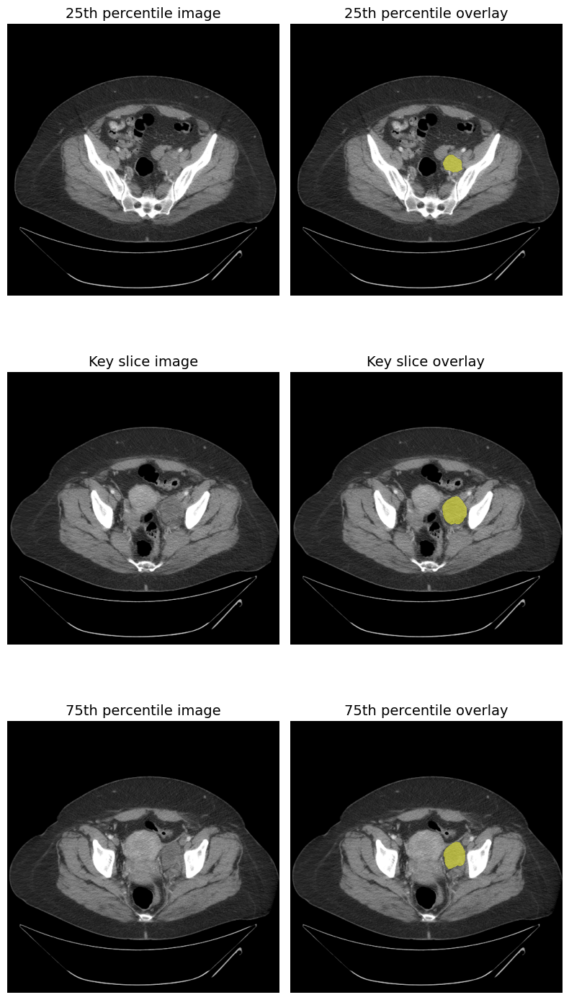

In [ ]:
slice_indices = np.arange(0, slice_idx_end - slice_idx_start)
slice_idx_25 = int(np.percentile(slice_indices, 25))
slice_idx_75 = int(np.percentile(slice_indices, 75))
percentile_slices = [slice_idx_25, key_slice_idx_offset, slice_idx_75]

fig, axes = plt.subplots(3, 2, figsize=(8, 15))
for ax in axes.flatten():
    ax.axis('off')

row_titles = ['25th percentile image', 'Key slice image', '75th percentile image']
row_titles_masks = ['25th percentile overlay', 'Key slice overlay', '75th percentile overlay']

for row_idx, slice_idx in enumerate(percentile_slices):
    imgs_2D = img_3D_ori[slice_idx].T
    imgs_2D = imgs_2D[:, :, None].repeat(3, axis=-1)
    segs_2D = segs_3D[slice_idx].T

    axes[row_idx, 0].imshow(imgs_2D, cmap='gray')
    axes[row_idx, 1].imshow(imgs_2D, cmap='gray')
    show_mask(segs_2D, ax=axes[row_idx, 1])

    axes[row_idx, 0].set_title(row_titles[row_idx], fontsize=14)
    axes[row_idx, 1].set_title(row_titles_masks[row_idx], fontsize=14)

plt.tight_layout()

In [1]:
!nvidia-smi

Wed Sep  2 15:49:11 2026       
+-----------------------------------------------------------------------------------------+
| NVIDIA-SMI 580.82.07              Driver Version: 580.82.07      CUDA Version: 13.0     |
+-----------------------------------------+------------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id          Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |           Memory-Usage | GPU-Util  Compute M. |
|                                         |                        |               MIG M. |
|=========================================+========================+======================|
|   0  Tesla T4                       Off |   00000000:00:04.0 Off |                    0 |
| N/A   38C    P8             11W /   70W |       0MiB /  15360MiB |      0%      Default |
|                                         |                        |                  N/A |
+-----------------------------------------+-----

In [2]:
!git clone https://github.com/bowang-lab/MedSAM2.git

Cloning into 'MedSAM2'...
remote: Enumerating objects: 297, done.
remote: Counting objects: 100% (165/165), done.
remote: Compressing objects: 100% (101/101), done.
remote: Total 297 (delta 91), reused 64 (delta 64), pack-reused 132 (from 1)
Receiving objects: 100% (297/297), 18.82 MiB | 18.87 MiB/s, done.
Resolving deltas: 100% (122/122), done.


In [3]:
%cd /content/MedSAM2

/content/MedSAM2


In [4]:
!pip install -e .

Obtaining file:///content/MedSAM2
  Installing build dependencies ... done
  Checking if build backend supports build_editable ... done
  Getting requirements to build editable ... done
  Preparing editable metadata (pyproject.toml) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 42.2/42.2 kB 2.3 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 163.1/163.1 kB 10.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 52.8/52.8 MB 13.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 129.6/129.6 kB 14.1 MB/s eta 0:00:00
  Building editable for MedSAM2 (pyproject.toml) ... done
  Created wheel for MedSAM2: filename=medsam2-1.0-0.editable-cp313-cp313-linux_x86_64.whl size=10553 sha256=323216769a2f3771eecc062f72e42661290ec3c5f86a2181e2c74975699e9292
  Stored in directory: /tmp/pip-ephem-wheel-cache-gk3t_u9v/wheels/9a/f7/8f/3994fffaad20687a3124a90a2c4663eba83d344e6719fe390d
  Created wheel for iopath: filename=io

In [5]:
!bash download.sh

--2026-09-02 15:56:12--  https://huggingface.co/wanglab/MedSAM2/resolve/main/MedSAM2_2411.pt
Resolving huggingface.co (huggingface.co)... 18.164.174.118, 18.164.174.55, 18.164.174.17, ...
Connecting to huggingface.co (huggingface.co)|18.164.174.118|:443... connected.
HTTP request sent, awaiting response... 302 Found
Location: https://us.gcp.cdn.hf.co/xet-bridge-us/67ec555237f4f95c13aa9748/a8339a4765ba20d3170ac7574cecd5d8760306181a683528ff61f94170262e4e?X-Xet-Cas-Uid=public&user_id=public&response-content-disposition=inline%3B+filename*%3DUTF-8%27%27MedSAM2_2411.pt%3B+filename%3D%22MedSAM2_2411.pt%22%3B&Expires=1788368173&Policy=eyJTdGF0ZW1lbnQiOlt7IlJlc291cmNlIjoiaHR0cHM6Ly91cy5nY3AuY2RuLmhmLmNvL3hldC1icmlkZ2UtdXMvNjdlYzU1NTIzN2Y0Zjk1YzEzYWE5NzQ4L2E4MzM5YTQ3NjViYTIwZDMxNzBhYzc1NzRjZWNkNWQ4NzYwMzA2MTgxYTY4MzUyOGZmNjFmOTQxNzAyNjJlNGVcXD9YLVhldC1DYXMtVWlkPXB1YmxpYyZ1c2VyX2lkPXB1YmxpYyZyZXNwb25zZS1jb250ZW50LWRpc3Bvc2l0aW9uPSoiLCJDb25kaXRpb24iOnsiRGF0ZUxlc3NUaGFuIjp7IkVwb2NoVGltZSI6MTc4ODM2

In [6]:
import os

print("Checkpoint files:")
for f in os.listdir("checkpoints"):
    print("✅", f)

Checkpoint files:
✅ MedSAM2_2411.pt
✅ MedSAM2_US_Heart.pt
✅ efficienttam_s_512x512.pt
✅ MedSAM2_MRI_LiverLesion.pt
✅ MedSAM2_latest.pt
✅ MedSAM2_CTLesion.pt
✅ sam2.1_hiera_tiny.pt
✅ efficienttam_ti_512x512.pt
✅ README.md


In [7]:
import torch

print("PyTorch version:", torch.__version__)
print("CUDA available:", torch.cuda.is_available())

if torch.cuda.is_available():
    print("GPU:", torch.cuda.get_device_name(0))

PyTorch version: 2.11.0+cu128
CUDA available: True
GPU: Tesla T4


In [8]:
import sam2

print("✅ MedSAM2/SAM2 imported successfully!")
print("Location:", sam2.__file__)

✅ MedSAM2/SAM2 imported successfully!
Location: /content/MedSAM2/sam2/__init__.py


In [9]:
import torch

checkpoint = "/content/MedSAM2/checkpoints/MedSAM2_CTLesion.pt"

print("Checkpoint exists:", __import__("os").path.exists(checkpoint))
print("Using GPU:", torch.cuda.get_device_name(0))

Checkpoint exists: True
Using GPU: Tesla T4


In [10]:
from sam2.build_sam import build_sam2_video_predictor

checkpoint = "/content/MedSAM2/checkpoints/MedSAM2_CTLesion.pt"
config = "configs/sam2.1/sam2.1_hiera_t.yaml"

predictor = build_sam2_video_predictor(
    config,
    checkpoint,
    device="cuda"
)

print("✅ MedSAM2 CT Lesion model loaded successfully!")

MissingConfigException: Cannot find primary config 'configs/sam2.1/sam2.1_hiera_t.yaml'. Check that it's in your config search path.

Config search path:
	provider=hydra, path=pkg://hydra.conf
	provider=main, path=pkg://sam2
	provider=schema, path=structured://

In [11]:
import os

for root, dirs, files in os.walk("/content/MedSAM2"):
    for file in files:
        if file.endswith(".yaml") and "hiera_t" in file:
            print(os.path.join(root, file))

/content/MedSAM2/sam2/configs/sam2.1_hiera_tiny_finetune512.yaml
/content/MedSAM2/sam2/configs/sam2.1_hiera_t512.yaml
/content/MedSAM2/sam2/configs/sam2.1_hiera_tiny512_FLARE_RECIST.yaml


In [12]:
from sam2.build_sam import build_sam2_video_predictor

checkpoint = "/content/MedSAM2/checkpoints/MedSAM2_CTLesion.pt"
config = "sam2.1_hiera_t512.yaml"

predictor = build_sam2_video_predictor(
    config,
    checkpoint,
    device="cuda"
)

print("✅ MedSAM2 CT Lesion model loaded successfully!")

MissingConfigException: Cannot find primary config 'sam2.1_hiera_t512.yaml'. Check that it's in your config search path.

Config search path:
	provider=hydra, path=pkg://hydra.conf
	provider=main, path=pkg://sam2
	provider=schema, path=structured://

In [13]:
!grep -R "MedSAM2_CTLesion.pt" -n /content/MedSAM2 | head -20

/content/MedSAM2/download.sh:21:MODEL4="MedSAM2_CTLesion.pt"
/content/MedSAM2/checkpoints/README.md:7:- `MedSAM2_CTLesion.pt`: Fine-tuned model for CT lesion segmentation
/content/MedSAM2/examples/infer_CT_LUNA25.py:32:    default="./hg_checkpoints/MedSAM2_CTLesion.pt", 


In [14]:
!sed -n '1,100p' /content/MedSAM2/examples/infer_CT_LUNA25.py

"""
This script is used to run inference on the LUNA25 dataset using the MedSAM2 CT lesion model with point prompts.

Manually refined masks: https://huggingface.co/datasets/wanglab/LUNA25-MedSAM2
image: https://zenodo.org/records/14223624
annotation: https://zenodo.org/records/14673658
"""

from tqdm import tqdm
import os
from os.path import join
import pandas as pd
import numpy as np
import argparse

from PIL import Image
import SimpleITK as sitk
import torch
import torch.multiprocessing as mp
from sam2.build_sam import build_sam2_video_predictor_npz

torch.set_float32_matmul_precision('high')
torch.manual_seed(2024)
torch.cuda.manual_seed(2024)
np.random.seed(2024)

parser = argparse.ArgumentParser()

parser.add_argument(
    '--checkpoint',
    type=str,
    default="./hg_checkpoints/MedSAM2_CTLesion.pt", 
    help='checkpoint path',
)
parser.add_argument(
    '--cfg',
    type=str,
    default="configs/sam2.1/sam2.1_hiera_t512.yaml",
    help='model config',
)
parser.add_argument(

In [15]:
!head -35 /content/MedSAM2/examples/infer_CT_LUNA25.py

"""
This script is used to run inference on the LUNA25 dataset using the MedSAM2 CT lesion model with point prompts.

Manually refined masks: https://huggingface.co/datasets/wanglab/LUNA25-MedSAM2
image: https://zenodo.org/records/14223624
annotation: https://zenodo.org/records/14673658
"""

from tqdm import tqdm
import os
from os.path import join
import pandas as pd
import numpy as np
import argparse

from PIL import Image
import SimpleITK as sitk
import torch
import torch.multiprocessing as mp
from sam2.build_sam import build_sam2_video_predictor_npz

torch.set_float32_matmul_precision('high')
torch.manual_seed(2024)
torch.cuda.manual_seed(2024)
np.random.seed(2024)

parser = argparse.ArgumentParser()

parser.add_argument(
    '--checkpoint',
    type=str,
    default="./hg_checkpoints/MedSAM2_CTLesion.pt", 
    help='checkpoint path',
)
parser.add_argument(


In [16]:
from sam2.build_sam import build_sam2_video_predictor_npz

checkpoint = "/content/MedSAM2/checkpoints/MedSAM2_CTLesion.pt"
config = "/content/MedSAM2/sam2/configs/sam2.1_hiera_t512.yaml"

predictor = build_sam2_video_predictor_npz(
    config,
    checkpoint
)

print("✅ MedSAM2 CT Lesion model loaded successfully!")

MissingConfigException: Cannot find primary config 'content/MedSAM2/sam2/configs/sam2.1_hiera_t512.yaml'. Check that it's in your config search path.

Config search path:
	provider=hydra, path=pkg://hydra.conf
	provider=main, path=pkg://sam2
	provider=schema, path=structured://

In [17]:
%cd /content/MedSAM2

/content/MedSAM2


In [18]:
import os
import sam2

print("Config file exists:", os.path.exists(
    "/content/MedSAM2/sam2/configs/sam2.1_hiera_t512.yaml"
))
print("SAM2 package:", sam2.__file__)

Config file exists: True
SAM2 package: /content/MedSAM2/sam2/__init__.py


In [20]:
import os

os.environ["HYDRA_FULL_ERROR"] = "1"

from hydra import initialize_config_module
from hydra.core.global_hydra import GlobalHydra

GlobalHydra.instance().clear()

initialize_config_module(
    config_module="sam2.configs",
    version_base="1.2"
)

print("✅ Hydra configuration initialized!")

✅ Hydra configuration initialized!


In [21]:
from sam2.build_sam import build_sam2_video_predictor_npz

checkpoint = "/content/MedSAM2/checkpoints/MedSAM2_CTLesion.pt"

predictor = build_sam2_video_predictor_npz(
    "sam2.1_hiera_t512.yaml",
    checkpoint
)

print("✅ MedSAM2 CT Lesion model loaded successfully!")

MissingConfigException: Primary config module 'sam2.configs' not found.
Check that it's correct and contains an __init__.py file

In [22]:
!grep -n "def build_sam2_video_predictor_npz" /content/MedSAM2/sam2/build_sam.py

135:def build_sam2_video_predictor_npz(


In [23]:
!sed -n '135,180p' /content/MedSAM2/sam2/build_sam.py


def build_sam2_video_predictor_npz(
    config_file,
    ckpt_path=None,
    device=None,
    mode="eval",
    hydra_overrides_extra=[],
    apply_postprocessing=True,
    **kwargs,
):
    # Use the provided device or get the best available one
    device = device or get_best_available_device()
    logging.info(f"Using device: {device}")

    hydra_overrides = [
        "++model._target_=sam2.sam2_video_predictor_npz.SAM2VideoPredictorNPZ",
    ]
    if apply_postprocessing:
        hydra_overrides_extra = hydra_overrides_extra.copy()
        hydra_overrides_extra += [
            # dynamically fall back to multi-mask if the single mask is not stable
            "++model.sam_mask_decoder_extra_args.dynamic_multimask_via_stability=true",
            "++model.sam_mask_decoder_extra_args.dynamic_multimask_stability_delta=0.05",
            "++model.sam_mask_decoder_extra_args.dynamic_multimask_stability_thresh=0.98",
            # the sigmoid mask logits on interacted frames with clicks i

In [24]:
import os
import hydra

print("Config folder:")
print(os.listdir("/content/MedSAM2/sam2/configs"))

Config folder:
['efficienttam_ti_512.yaml', 'efficientmedsam_s_512_FLARE_RECIST.yaml', 'sam2.1_hiera_tiny_finetune512.yaml', 'sam2.1_hiera_t512.yaml', 'sam2.1_hiera_tiny512_FLARE_RECIST.yaml', 'efficientmedsam_ti_512_FLARE_RECIST.yaml']


In [25]:
from hydra import initialize_config_dir
from hydra.core.global_hydra import GlobalHydra

GlobalHydra.instance().clear()

initialize_config_dir(
    config_dir="/content/MedSAM2/sam2/configs",
    version_base="1.2"
)

print("✅ Hydra is now connected to the MedSAM2 config folder!")


✅ Hydra is now connected to the MedSAM2 config folder!


In [26]:
from sam2.build_sam import build_sam2_video_predictor_npz

checkpoint = "/content/MedSAM2/checkpoints/MedSAM2_CTLesion.pt"

predictor = build_sam2_video_predictor_npz(
    "sam2.1_hiera_t512.yaml",
    checkpoint,
    device="cuda"
)

print("✅ MedSAM2 CT Lesion model loaded successfully!")

/content/MedSAM2/sam2/modeling/sam/transformer.py:23: UserWarning: Flash Attention is disabled as it requires a GPU with Ampere (8.0) CUDA capability.
  OLD_GPU, USE_FLASH_ATTN, MATH_KERNEL_ON = get_sdpa_settings()


✅ MedSAM2 CT Lesion model loaded successfully!


In [27]:
import nibabel as nib
import os
import numpy as np

# Find your uploaded NIfTI file
files = [f for f in os.listdir("/content") if f.endswith((".nii", ".nii.gz"))]

print("NIfTI files found:", files)

# Use the first NIfTI file
ct_file = "/content/" + files[0]

# Load CT scan
nii = nib.load(ct_file)
ct = nii.get_fdata()

print("✅ CT scan loaded successfully!")
print("File:", ct_file)
print("Shape:", ct.shape)
print("Data type:", ct.dtype)
print("Minimum:", np.min(ct))
print("Maximum:", np.max(ct))

NIfTI files found: ['VS_0005_01_t2IAC.nii.gz']
✅ CT scan loaded successfully!
File: /content/VS_0005_01_t2IAC.nii.gz
Shape: (512, 512, 150)
Data type: float64
Minimum: 0.0
Maximum: 2088.0


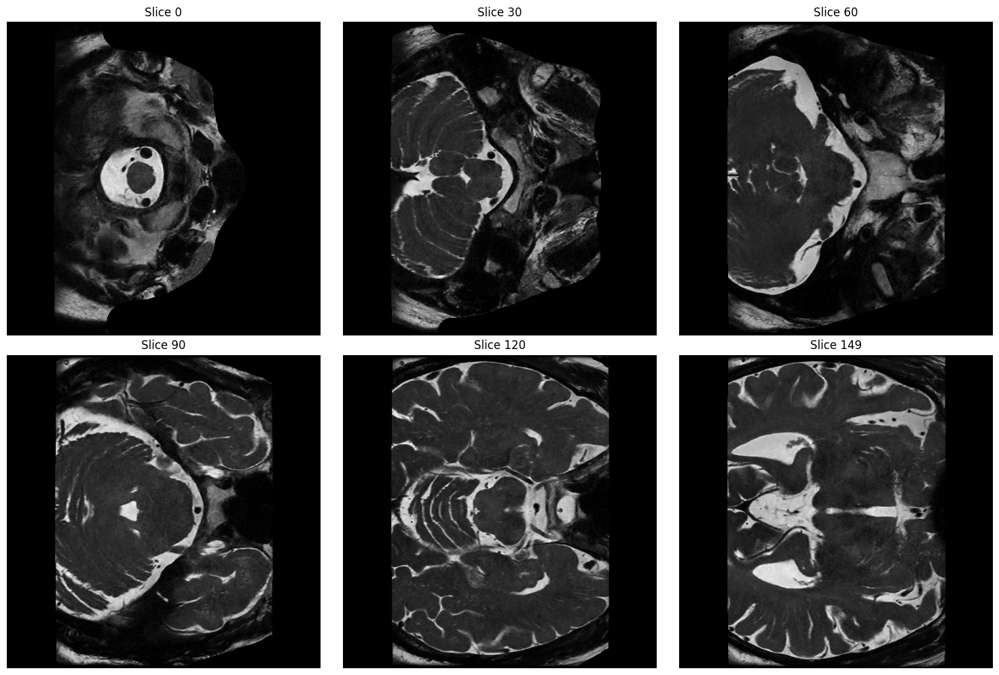

In [28]:
import matplotlib.pyplot as plt

# Display 6 slices from the CT volume
fig, axes = plt.subplots(2, 3, figsize=(15, 10))

slices = [0, 30, 60, 90, 120, 149]

for ax, slice_idx in zip(axes.flat, slices):
    ax.imshow(ct[:, :, slice_idx], cmap="gray")
    ax.set_title(f"Slice {slice_idx}")
    ax.axis("off")

plt.tight_layout()
plt.show()

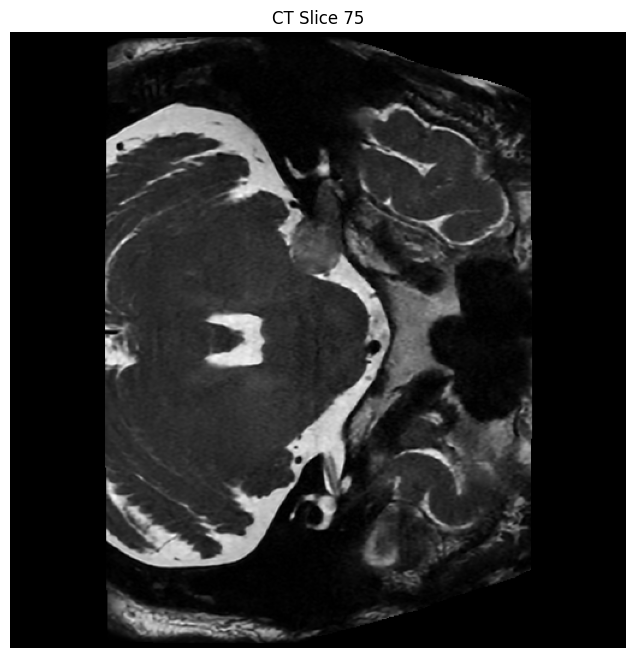

In [29]:
import matplotlib.pyplot as plt

# Show one middle slice
slice_idx = 75

plt.figure(figsize=(8, 8))
plt.imshow(ct[:, :, slice_idx], cmap="gray")
plt.title(f"CT Slice {slice_idx}")
plt.axis("off")
plt.show()

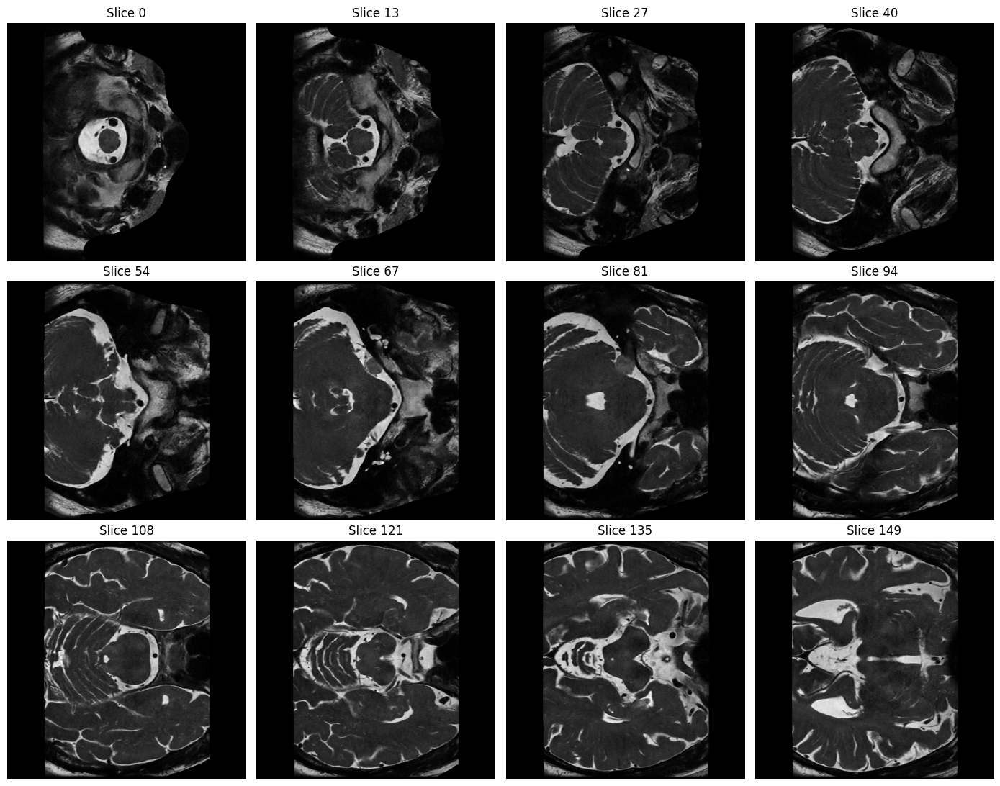

In [30]:
import matplotlib.pyplot as plt

# Show 12 slices evenly spaced through the CT scan
slice_indices = np.linspace(0, ct.shape[2] - 1, 12, dtype=int)

fig, axes = plt.subplots(3, 4, figsize=(14, 11))

for ax, idx in zip(axes.flat, slice_indices):
    ax.imshow(ct[:, :, idx], cmap="gray")
    ax.set_title(f"Slice {idx}")
    ax.axis("off")

plt.tight_layout()
plt.show()

In [32]:
import matplotlib.pyplot as plt
from ipywidgets import interact, IntSlider

def show_slice(slice_idx):
    plt.figure(figsize=(7, 7))
    plt.imshow(ct[:, :, slice_idx], cmap="gray")
    plt.title(f"CT Slice {slice_idx} / 149")
    plt.axis("off")
    plt.show()

interact(
    show_slice,
    slice_idx=IntSlider(
        min=0,
        max=ct.shape[2] - 1,
        step=1,
        value=75,
        description="Slice:"
    )
);

interactive(children=(IntSlider(value=75, description='Slice:', max=149), Output()), _dom_classes=('widget-int…

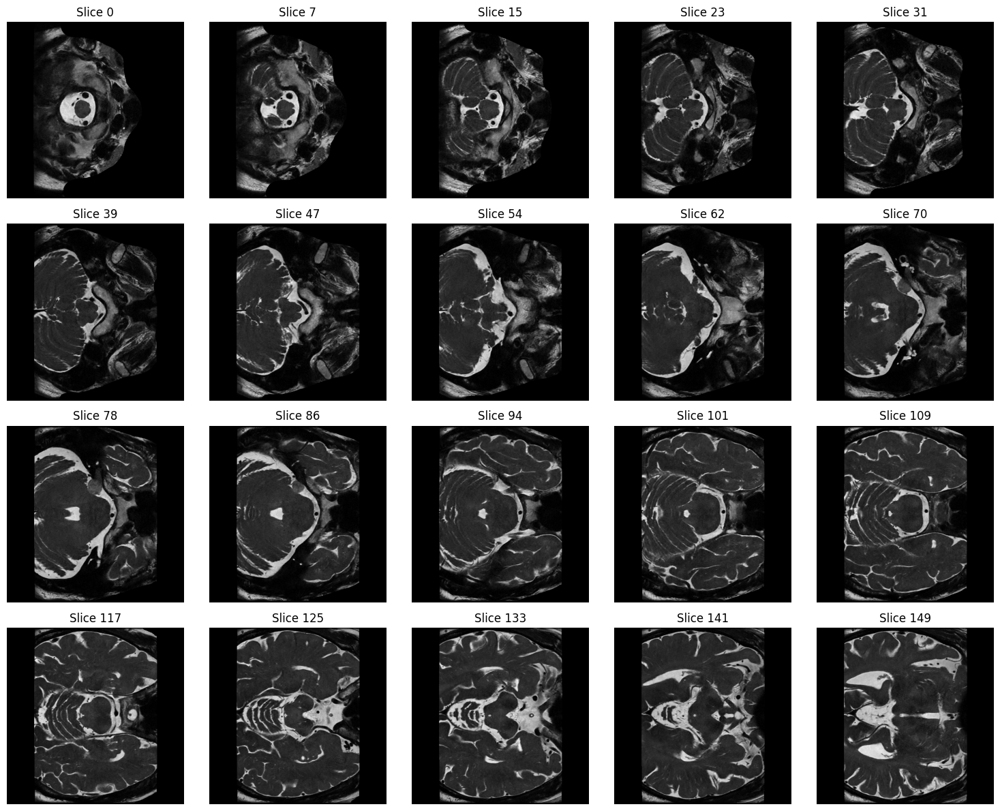

Displayed slices: [0, 7, 15, 23, 31, 39, 47, 54, 62, 70, 78, 86, 94, 101, 109, 117, 125, 133, 141, 149]


In [33]:
import matplotlib.pyplot as plt
import numpy as np

# Calculate how much non-background content is present in each slice
slice_scores = []

for i in range(ct.shape[2]):
    slice_img = ct[:, :, i]
    score = np.sum(slice_img > 100)
    slice_scores.append(score)

slice_scores = np.array(slice_scores)

# Pick slices spread across the scan
indices = np.linspace(0, ct.shape[2] - 1, 20, dtype=int)

fig, axes = plt.subplots(4, 5, figsize=(15, 12))

for ax, idx in zip(axes.flat, indices):
    ax.imshow(ct[:, :, idx], cmap="gray")
    ax.set_title(f"Slice {idx}")
    ax.axis("off")

plt.tight_layout()
plt.show()

print("Displayed slices:", indices.tolist())

Candidate slices:
[57, 58, 59, 77, 78, 79, 80, 81, 82, 143, 144, 145]


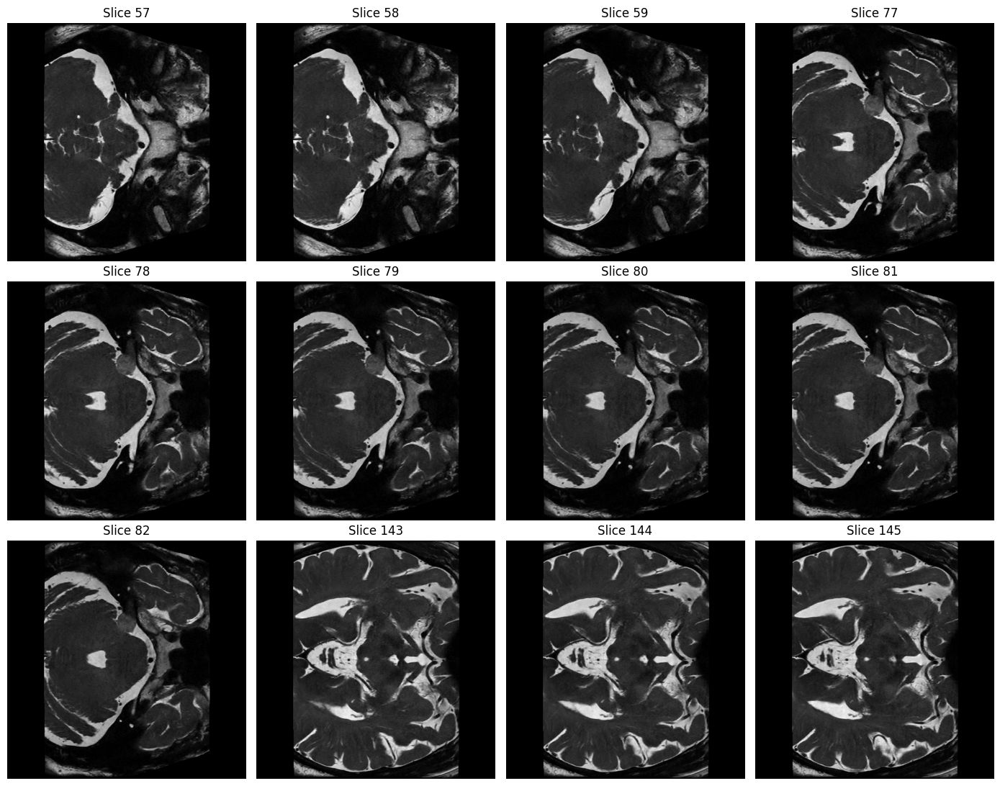

In [34]:
import numpy as np
import matplotlib.pyplot as plt

# Normalize the volume
v = ct.astype(np.float32)
v = (v - v.min()) / (v.max() - v.min() + 1e-8)

# Calculate variation/complexity in each slice
scores = []

for i in range(v.shape[2]):
    img = v[:, :, i]

    # Ignore very dark background
    foreground = img[img > 0.05]

    if len(foreground) == 0:
        scores.append(0)
        continue

    # Score based on intensity variation
    scores.append(np.std(foreground))

scores = np.array(scores)

# Select the 12 highest-scoring slices
candidate_slices = np.argsort(scores)[-12:]
candidate_slices = np.sort(candidate_slices)

print("Candidate slices:")
print(candidate_slices.tolist())

# Display them
fig, axes = plt.subplots(3, 4, figsize=(14, 11))

for ax, idx in zip(axes.flat, candidate_slices):
    ax.imshow(ct[:, :, idx], cmap="gray")
    ax.set_title(f"Slice {idx}")
    ax.axis("off")

plt.tight_layout()
plt.show()

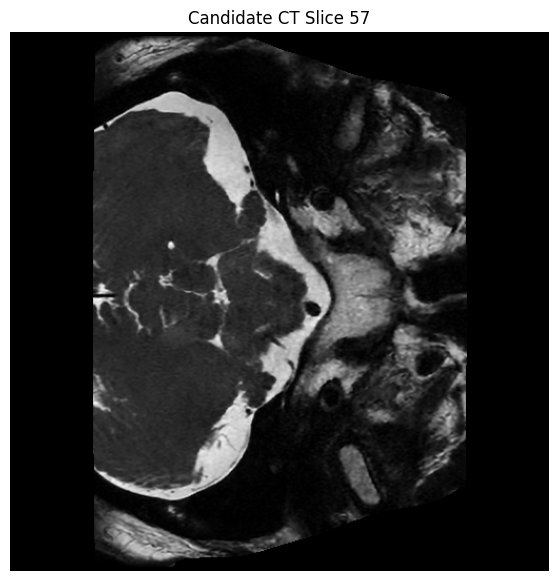

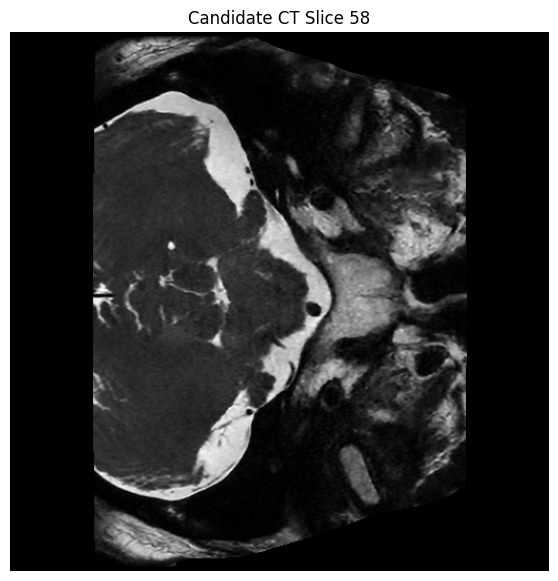

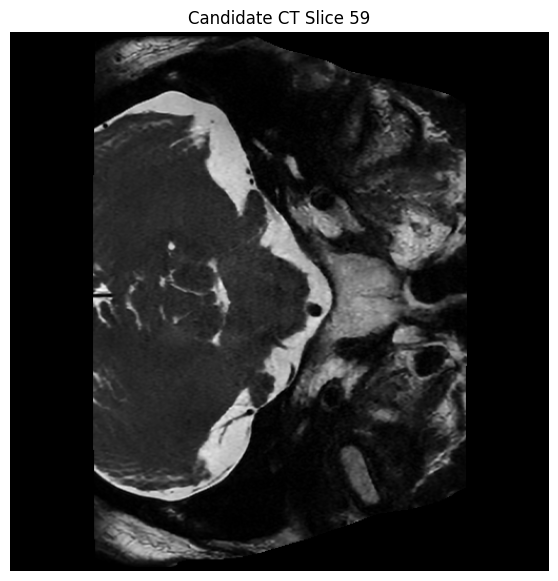

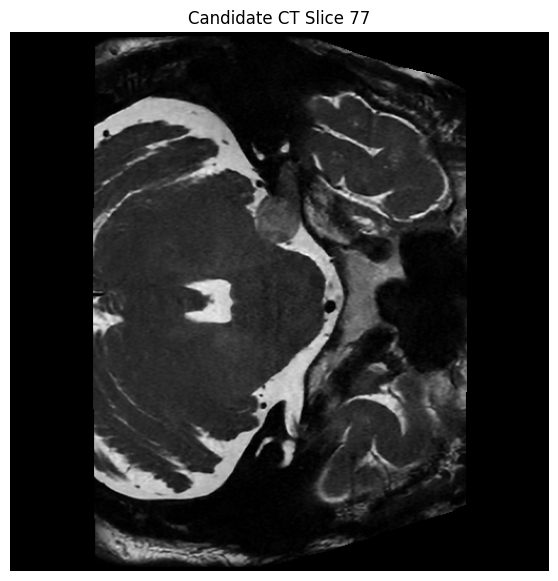

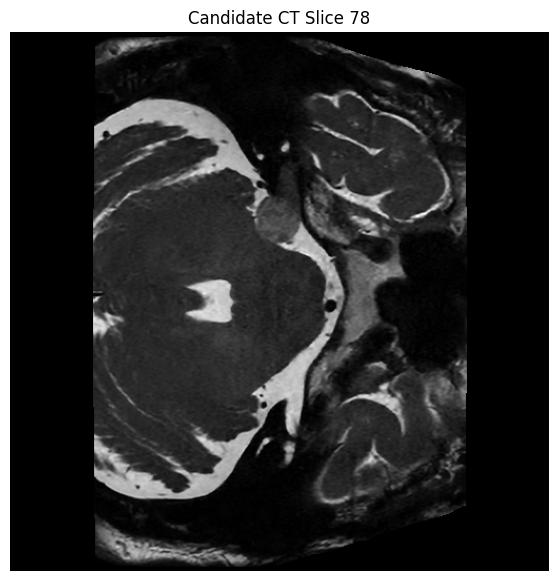

...

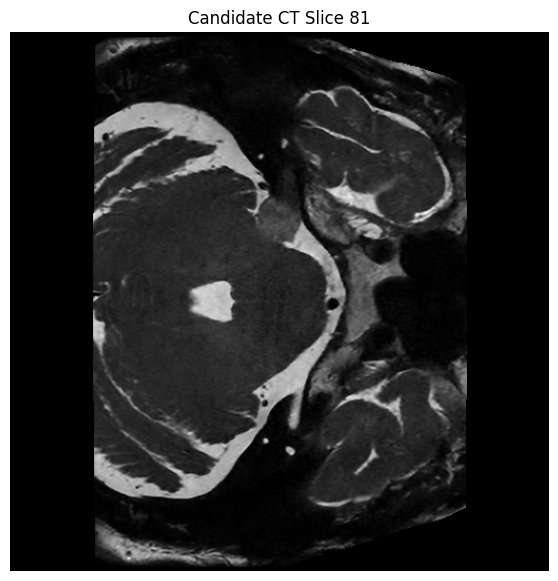

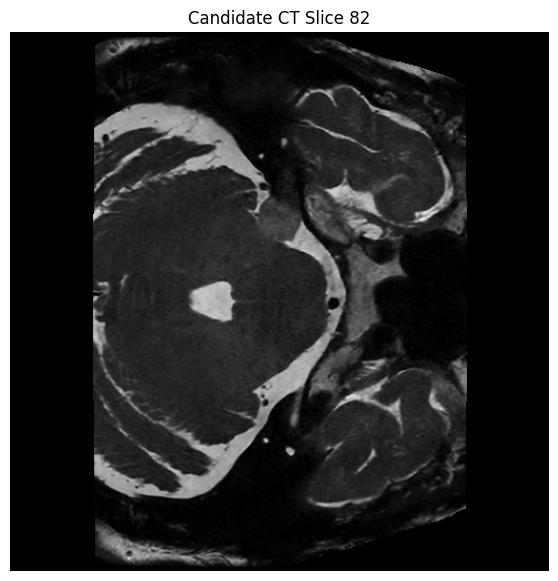

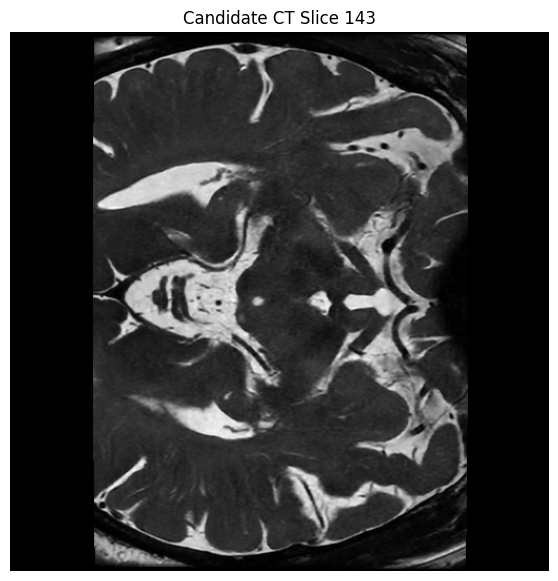

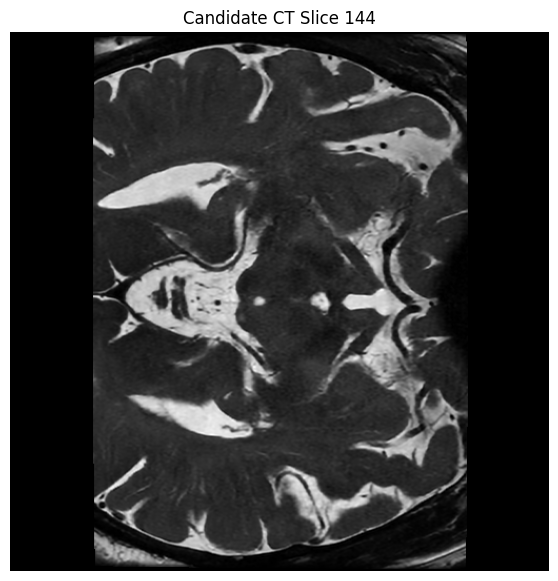

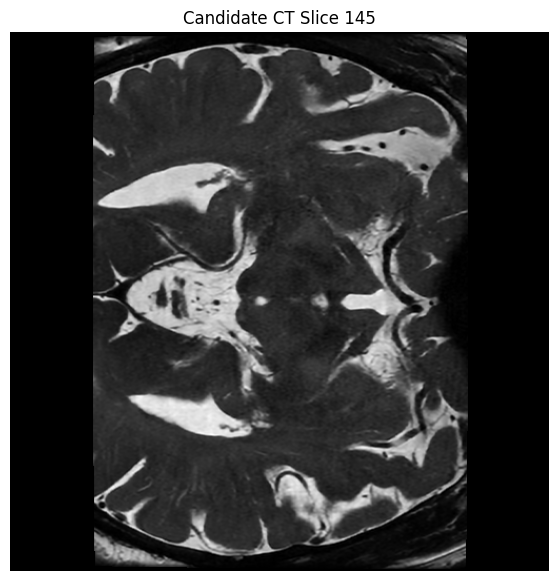

In [35]:
import matplotlib.pyplot as plt

candidate_slices = [57, 58, 59, 77, 78, 79, 80, 81, 82, 143, 144, 145]

for idx in candidate_slices:
    plt.figure(figsize=(7, 7))
    plt.imshow(ct[:, :, idx], cmap="gray")
    plt.title(f"Candidate CT Slice {idx}")
    plt.axis("off")
    plt.show()

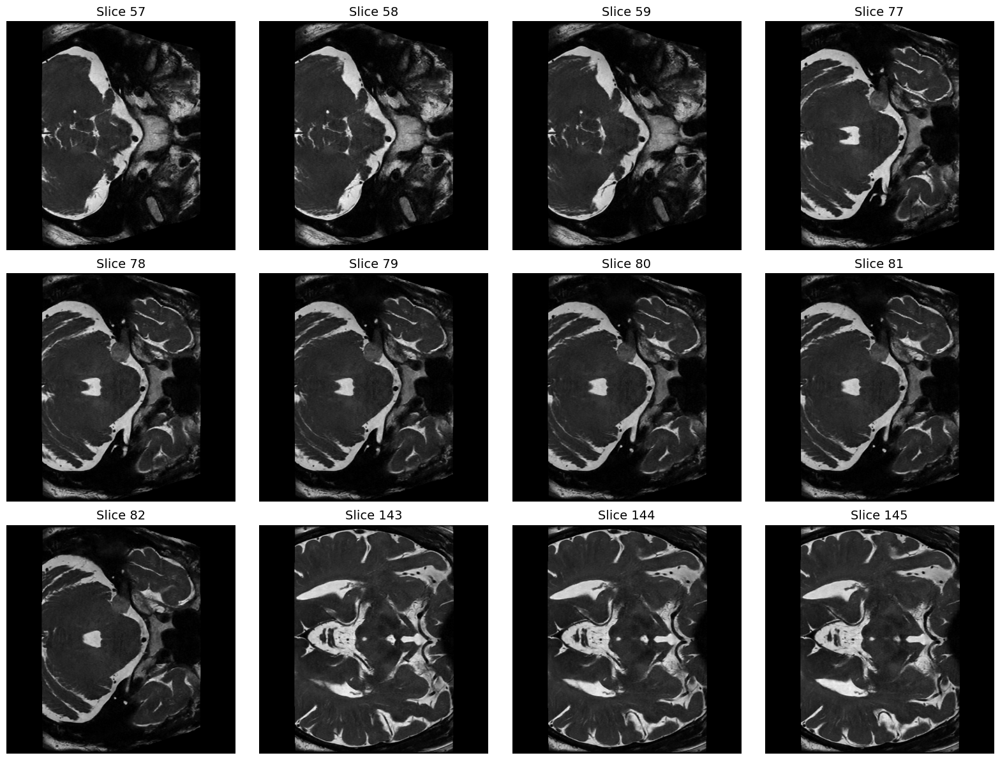

In [36]:
# Show the candidate slices with their numbers clearly
import matplotlib.pyplot as plt

candidate_slices = [57, 58, 59, 77, 78, 79, 80, 81, 82, 143, 144, 145]

fig, axes = plt.subplots(3, 4, figsize=(16, 12))

for ax, idx in zip(axes.flat, candidate_slices):
    ax.imshow(ct[:, :, idx], cmap="gray")
    ax.set_title(f"Slice {idx}", fontsize=14)
    ax.axis("off")

plt.tight_layout()
plt.show()

In [37]:
print("===== SCAN INFORMATION =====")
print("File:", ct_file)
print("Shape:", ct.shape)
print("Voxel spacing:", nii.header.get_zooms())
print("Units:", nii.header.get_xyzt_units())
print("Data type:", ct.dtype)

print("\n===== NIFTI HEADER =====")
print(nii.header)

===== SCAN INFORMATION =====
File: /content/VS_0005_01_t2IAC.nii.gz
Shape: (512, 512, 150)
Voxel spacing: (np.float32(0.2734), np.float32(0.2734), np.float32(0.4))
Units: ('mm', 'sec')
Data type: float64

===== NIFTI HEADER =====
<class 'nibabel.nifti1.Nifti1Header'> object, endian='<'
sizeof_hdr      : 348
data_type       : b''
db_name         : b''
extents         : 0
session_error   : 0
regular         : b'r'
dim_info        : 0
dim             : [  3 512 512 150   1   1   1   1]
intent_p1       : 0.0
intent_p2       : 0.0
intent_p3       : 0.0
intent_code     : none
datatype        : int16
bitpix          : 16
slice_start     : 0
pixdim          : [1.     0.2734 0.2734 0.4    0.     0.     0.     0.    ]
vox_offset      : 0.0
scl_slope       : nan
scl_inter       : nan
slice_end       : 0
slice_code      : unknown
xyzt_units      : 10
cal_max         : 0.0
cal_min         : 0.0
slice_duration  : 0.0
toffset         : 0.0
glmax           : 0
glmin           : 0
descrip         : b''

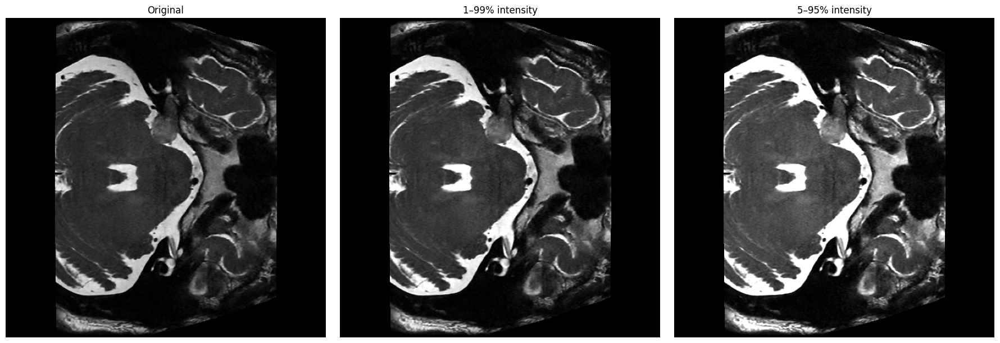

In [38]:
import matplotlib.pyplot as plt

# Show the middle slice with a few different intensity windows
slice_idx = 75
img = ct[:, :, slice_idx]

fig, axes = plt.subplots(1, 3, figsize=(18, 6))

axes[0].imshow(img, cmap="gray")
axes[0].set_title("Original")
axes[0].axis("off")

axes[1].imshow(img, cmap="gray", vmin=np.percentile(img, 1),
               vmax=np.percentile(img, 99))
axes[1].set_title("1–99% intensity")
axes[1].axis("off")

axes[2].imshow(img, cmap="gray", vmin=np.percentile(img, 5),
               vmax=np.percentile(img, 95))
axes[2].set_title("5–95% intensity")
axes[2].axis("off")

plt.tight_layout()
plt.show()

In [39]:
import os

print("Available MedSAM2 checkpoints:\n")

for root, dirs, files in os.walk("/content/MedSAM2"):
    for file in files:
        if file.endswith(".pt"):
            path = os.path.join(root, file)
            size_mb = os.path.getsize(path) / (1024 * 1024)
            print(f"✅ {file}  ({size_mb:.1f} MB)")

Available MedSAM2 checkpoints:

✅ MedSAM2_2411.pt  (148.8 MB)
✅ MedSAM2_US_Heart.pt  (148.8 MB)
✅ efficienttam_s_512x512.pt  (130.1 MB)
✅ MedSAM2_MRI_LiverLesion.pt  (148.8 MB)
✅ MedSAM2_latest.pt  (148.8 MB)
✅ MedSAM2_CTLesion.pt  (148.8 MB)
✅ sam2.1_hiera_tiny.pt  (148.8 MB)
✅ efficienttam_ti_512x512.pt  (68.3 MB)


In [40]:
import os

checkpoint = "/content/MedSAM2/checkpoints/MedSAM2_latest.pt"

print("Checking MedSAM2 latest checkpoint...")
print("Path:", checkpoint)
print("Exists:", os.path.exists(checkpoint))

if os.path.exists(checkpoint):
    print("✅ MedSAM2_latest.pt is ready!")
else:
    print("❌ Checkpoint not found at this location.")

Checking MedSAM2 latest checkpoint...
Path: /content/MedSAM2/checkpoints/MedSAM2_latest.pt
Exists: True
✅ MedSAM2_latest.pt is ready!


In [41]:
import os

# Search the MedSAM2 project for inference/demo scripts
root = "/content/MedSAM2"

for dirpath, dirnames, filenames in os.walk(root):
    for filename in filenames:
        if filename.endswith((".py", ".ipynb")):
            path = os.path.join(dirpath, filename)
            name = filename.lower()

            if any(x in name for x in ["infer", "demo", "predict", "test", "medsam"]):
                print(path)

/content/MedSAM2/medsam2_infer_CT_lesion_npz_recist.py
/content/MedSAM2/eff_medsam2_infer_CT_lesion_npz_recist.py
/content/MedSAM2/medsam2_infer_3D_CT.py
/content/MedSAM2/medsam2_infer_video.py
/content/MedSAM2/efficient_track_anything/efficienttam_image_predictor.py
/content/MedSAM2/efficient_track_anything/efficienttam_video_predictor.py
/content/MedSAM2/efficient_track_anything/efficienttam_video_predictor_npz.py
/content/MedSAM2/sam2/sam2_image_predictor.py
/content/MedSAM2/sam2/sam2_video_predictor_npz.py
/content/MedSAM2/sam2/sam2_video_predictor.py
/content/MedSAM2/notebooks/MedSAM2_Inference_Video.ipynb
/content/MedSAM2/notebooks/MedSAM2_inference_CT_Lesion.ipynb
/content/MedSAM2/examples/infer_CT_LUNA25.py


In [42]:
import os

print("Files in /content:")
for f in sorted(os.listdir("/content")):
    print(f)

Files in /content:
.config
MedSAM2
VS_0005_01_t2IAC.nii.gz
sample_data


In [43]:
!git clone --depth 1 https://github.com/bowang-lab/MedSAM2.git /content/MedSAM2_test 2>/dev/null || true

print("MedSAM2 test repository ready.")

MedSAM2 test repository ready.


In [44]:
!pip -q install huggingface_hub

from huggingface_hub import snapshot_download

snapshot_download(
    repo_id="bowang-lab/CT_DeepLesion-MedSAM2",
    repo_type="dataset",
    local_dir="/content/CT_DeepLesion-MedSAM2",
    allow_patterns=["images/*"],
)

print("✅ CT lesion sample data downloaded!")

RepositoryNotFoundError: 401 Client Error. (Request ID: Root=1-6a984f67-4e907c9613dd0aac5b163393;297150c8-3b98-4e83-9b98-a9cf151004b8)

Repository Not Found for url: https://huggingface.co/api/datasets/bowang-lab/CT_DeepLesion-MedSAM2/revision/main.
Please make sure you specified the correct `repo_id` and `repo_type`.
If you are trying to access a private or gated repo, make sure you are authenticated and your token has the required permissions.
For more details, see https://huggingface.co/docs/huggingface_hub/authentication
Invalid username or password.

In [45]:
from datasets import load_dataset

dataset = load_dataset(
    "wanglab/CT_DeepLesion-MedSAM2",
    split="train",
    streaming=True
)

sample = next(iter(dataset))

print("✅ One sample loaded!")
print(sample)

README.md:   0%|          | 0.00/5.85k [00:00<?, ?B/s]

✅ One sample loaded!
{'File_name': '000001_01_01_109.png', 'Patient_index': 1, 'Study_index': 1, 'Series_ID': 1, 'Key_slice_index': 109, 'Measurement_coordinates': '233.537, 95.0204, 234.057, 106.977, 231.169, 101.605, 236.252, 101.143', 'Bounding_boxes': '226.169, 90.0204, 241.252, 111.977', 'Lesion_diameters_Pixel_': '11.9677, 5.10387', 'Normalized_lesion_location': '0.44666, 0.283794, 0.434454', 'Coarse_lesion_type': 3, 'Possibly_noisy': 0, 'Slice_range': '103, 115', 'Spacing_mm_px_': '0.488281, 0.488281, 5', 'Image_size': '512, 512', 'DICOM_windows': '-175, 275', 'Patient_gender': 'F', 'Patient_age': 62.0, 'Train_Val_Test': 3}


In [46]:
from huggingface_hub import hf_hub_download

image_path = hf_hub_download(
    repo_id="wanglab/CT_DeepLesion-MedSAM2",
    repo_type="dataset",
    filename="images/000001_01_01_109.png",
    local_dir="/content/CT_sample"
)

print("✅ Sample CT image downloaded!")
print("Path:", image_path)

RemoteEntryNotFoundError: 404 Client Error. (Request ID: Root=1-6a984fc1-65631fd664c35e355131391b;b6f0b232-e0dc-478b-b69e-7fb8871c65f4)

Entry Not Found for url: https://huggingface.co/datasets/wanglab/CT_DeepLesion-MedSAM2/resolve/main/images/000001_01_01_109.png.

In [49]:
!pip -q install gradio

In [50]:
import gradio
print("Gradio version:", gradio.__version__)

Gradio version: 6.26.0


In [52]:
import gradio as gr
import nibabel as nib
import numpy as np

def load_nifti(file):
    nii = nib.load(file)
    volume = nii.get_fdata()

    # Take middle slice
    slice_idx = volume.shape[2] // 2
    image = volume[:, :, slice_idx]

    # Normalize image
    image = image.astype(np.float32)
    image = (image - image.min()) / (image.max() - image.min() + 1e-8)

    # Convert to 8-bit
    image = (image * 255).astype(np.uint8)

    return image, slice_idx

demo = gr.Interface(
    fn=load_nifti,
    inputs=gr.File(
        label="Upload CT NIfTI (.nii or .nii.gz)",
        file_types=[".nii", ".gz"]
    ),
    outputs=[
        gr.Image(
            label="Select lesion area / bounding box",
            type="numpy"
        ),
        gr.Number(label="Current Slice")
    ],
    title="MedSAM2 Lesion Segmentation",
    description="Upload a CT NIfTI image. The next step will allow a bounding box to be drawn."
)

demo.launch(share=True)

Colab notebook detected. To show errors in colab notebook, set debug=True in launch()
* Running on public URL: https://811834bf05b9a38672.gradio.live

This share link is temporary and will last for up to 1 week (best effort). For free permanent hosting and GPU upgrades, run `gradio deploy` from the terminal in the working directory to deploy to Hugging Face Spaces (https://huggingface.co/spaces)


In [53]:
import gradio as gr

print("Gradio version:", gr.__version__)

Gradio version: 6.26.0


In [54]:
import gradio as gr

def show_box(image):
    return image

demo = gr.Interface(
    fn=show_box,
    inputs=gr.Image(
        label="Draw Bounding Box Around Lesion",
        type="numpy",
        sources=["upload"],
        interactive=True
    ),
    outputs=gr.Image(label="Selected Image"),
    title="MedSAM2 - Bounding Box",
    description="Upload an image and draw a bounding box around the lesion."
)

demo.launch(share=True)

Colab notebook detected. To show errors in colab notebook, set debug=True in launch()
* Running on public URL: https://e63fd333bf0e8ac5eb.gradio.live

This share link is temporary and will last for up to 1 week (best effort). For free permanent hosting and GPU upgrades, run `gradio deploy` from the terminal in the working directory to deploy to Hugging Face Spaces (https://huggingface.co/spaces)


In [55]:
import gradio as gr

def get_image(image):
    if image is None:
        return "No image selected"

    return f"Image received: {image.shape}"

demo = gr.Interface(
    fn=get_image,
    inputs=gr.Image(
        label="Upload Image",
        type="numpy"
    ),
    outputs=gr.Textbox(label="Status"),
    title="MedSAM2 Bounding Box Test"
)

demo.launch(share=True)

Colab notebook detected. To show errors in colab notebook, set debug=True in launch()
* Running on public URL: https://cf94ff5e66aa65fdec.gradio.live

This share link is temporary and will last for up to 1 week (best effort). For free permanent hosting and GPU upgrades, run `gradio deploy` from the terminal in the working directory to deploy to Hugging Face Spaces (https://huggingface.co/spaces)


In [56]:
import gradio as gr
import nibabel as nib
import numpy as np

def load_nifti(file):
    nii = nib.load(file)
    volume = nii.get_fdata()

    slice_idx = volume.shape[2] // 2
    image = volume[:, :, slice_idx]

    image = image.astype(np.float32)
    image = (image - image.min()) / (image.max() - image.min() + 1e-8)
    image = (image * 255).astype(np.uint8)

    return image, f"Volume shape: {volume.shape}\nShowing slice: {slice_idx}"

demo = gr.Interface(
    fn=load_nifti,
    inputs=gr.File(
        label="Upload Medical Image (.nii / .nii.gz)",
        file_types=[".nii", ".gz"],
        type="filepath"
    ),
    outputs=[
        gr.Image(label="Medical Image Slice"),
        gr.Textbox(label="Information")
    ],
    title="MedSAM2 Medical Image Segmentation",
    description="Upload a NIfTI medical image file."
)

demo.launch(share=True)

Colab notebook detected. To show errors in colab notebook, set debug=True in launch()
* Running on public URL: https://afebbd2aff09f4beae.gradio.live

This share link is temporary and will last for up to 1 week (best effort). For free permanent hosting and GPU upgrades, run `gradio deploy` from the terminal in the working directory to deploy to Hugging Face Spaces (https://huggingface.co/spaces)


In [57]:
import gradio as gr
import nibabel as nib
import numpy as np

volume = None

def load_nifti(file):
    global volume

    nii = nib.load(file)
    volume = nii.get_fdata()

    middle = volume.shape[2] // 2
    image = volume[:, :, middle]

    image = image.astype(np.float32)
    image = (image - image.min()) / (image.max() - image.min() + 1e-8)
    image = (image * 255).astype(np.uint8)

    return image, gr.Slider(
        minimum=0,
        maximum=volume.shape[2] - 1,
        value=middle,
        step=1
    )

def show_slice(slice_number):
    if volume is None:
        return None

    image = volume[:, :, int(slice_number)]

    image = image.astype(np.float32)
    image = (image - image.min()) / (image.max() - image.min() + 1e-8)
    image = (image * 255).astype(np.uint8)

    return image

with gr.Blocks() as demo:

    gr.Markdown("# 🧠 MedSAM2 Medical Image Segmentation")

    file_input = gr.File(
        label="Upload Medical Image (.nii / .nii.gz)",
        file_types=[".nii", ".gz"],
        type="filepath"
    )

    slice_slider = gr.Slider(
        minimum=0,
        maximum=1,
        value=0,
        step=1,
        label="Select Slice"
    )

    image_output = gr.Image(
        label="Medical Image Slice",
        type="numpy"
    )

    file_input.change(
        load_nifti,
        inputs=file_input,
        outputs=[image_output, slice_slider]
    )

    slice_slider.change(
        show_slice,
        inputs=slice_slider,
        outputs=image_output
    )

demo.launch(share=True)

Colab notebook detected. To show errors in colab notebook, set debug=True in launch()
* Running on public URL: https://feb82a2ff4e359c3e1.gradio.live

This share link is temporary and will last for up to 1 week (best effort). For free permanent hosting and GPU upgrades, run `gradio deploy` from the terminal in the working directory to deploy to Hugging Face Spaces (https://huggingface.co/spaces)


In [58]:
import gradio as gr

print("Starting bounding-box interface...")

with gr.Blocks() as demo:

    gr.Markdown("# 🧠 MedSAM2 — Bounding Box Selection")

    gr.Markdown(
        "1. Upload your NIfTI file\n"
        "2. Select a slice\n"
        "3. Draw a box around the lesion"
    )

    file_input = gr.File(
        label="Upload Medical Image (.nii / .nii.gz)",
        file_types=[".nii", ".gz"],
        type="filepath"
    )

    slice_slider = gr.Slider(
        minimum=0,
        maximum=149,
        value=75,
        step=1,
        label="Select Slice"
    )

    image = gr.Image(
        label="Draw Bounding Box Around Lesion",
        type="numpy",
        interactive=True
    )

    gr.Markdown(
        "⬆️ For this test, upload your medical file and use the image "
        "interaction tools to select the lesion region."
    )

demo.launch(share=True)

Starting bounding-box interface...
Colab notebook detected. To show errors in colab notebook, set debug=True in launch()
* Running on public URL: https://7bbe5e6d0915b9de84.gradio.live

This share link is temporary and will last for up to 1 week (best effort). For free permanent hosting and GPU upgrades, run `gradio deploy` from the terminal in the working directory to deploy to Hugging Face Spaces (https://huggingface.co/spaces)


In [59]:
import os

MODEL_PATH = "/content/MedSAM2/checkpoints/MedSAM2_latest.pt"

print("Model exists:", os.path.exists(MODEL_PATH))
print("Model path:", MODEL_PATH)

Model exists: True
Model path: /content/MedSAM2/checkpoints/MedSAM2_latest.pt


In [60]:
import sys
import os
import torch

sys.path.insert(0, "/content/MedSAM2")

from sam2.build_sam import build_sam2

CONFIG = "configs/sam2.1/sam2.1_hiera_t.yaml"
MODEL_PATH = "/content/MedSAM2/checkpoints/MedSAM2_latest.pt"

device = "cuda" if torch.cuda.is_available() else "cpu"

print("Device:", device)

medsam2_model = build_sam2(
    CONFIG,
    MODEL_PATH,
    device=device
)

print("✅ MedSAM2 model loaded successfully!")

Device: cuda


MissingConfigException: Cannot find primary config 'configs/sam2.1/sam2.1_hiera_t.yaml'. Check that it's in your config search path.

Config search path:
	provider=hydra, path=pkg://hydra.conf
	provider=main, path=file:///content/MedSAM2/sam2/configs
	provider=schema, path=structured://

In [61]:
import torch
from sam2.build_sam import build_sam2

MODEL_PATH = "/content/MedSAM2/checkpoints/MedSAM2_latest.pt"

device = "cuda" if torch.cuda.is_available() else "cpu"

medsam2_model = build_sam2(
    "sam2.1/sam2.1_hiera_t.yaml",
    MODEL_PATH,
    device=device
)

print("Device:", device)
print("✅ MedSAM2 model loaded successfully!")

MissingConfigException: Cannot find primary config 'sam2.1/sam2.1_hiera_t.yaml'. Check that it's in your config search path.

Config search path:
	provider=hydra, path=pkg://hydra.conf
	provider=main, path=file:///content/MedSAM2/sam2/configs
	provider=schema, path=structured://

In [62]:
import os

config_folder = "/content/MedSAM2/sam2/configs"

for root, dirs, files in os.walk(config_folder):
    for file in files:
        if file.endswith(".yaml"):
            print(os.path.join(root, file))

/content/MedSAM2/sam2/configs/efficienttam_ti_512.yaml
/content/MedSAM2/sam2/configs/efficientmedsam_s_512_FLARE_RECIST.yaml
/content/MedSAM2/sam2/configs/sam2.1_hiera_tiny_finetune512.yaml
/content/MedSAM2/sam2/configs/sam2.1_hiera_t512.yaml
/content/MedSAM2/sam2/configs/sam2.1_hiera_tiny512_FLARE_RECIST.yaml
/content/MedSAM2/sam2/configs/efficientmedsam_ti_512_FLARE_RECIST.yaml


In [63]:
import torch
from sam2.build_sam import build_sam2

MODEL_PATH = "/content/MedSAM2/checkpoints/MedSAM2_latest.pt"
CONFIG = "sam2.1_hiera_t512.yaml"

device = "cuda" if torch.cuda.is_available() else "cpu"

print("Device:", device)

medsam2_model = build_sam2(
    CONFIG,
    MODEL_PATH,
    device=device
)

print("✅ MedSAM2 model loaded successfully!")

Device: cuda
✅ MedSAM2 model loaded successfully!


In [64]:
from sam2.sam2_image_predictor import SAM2ImagePredictor

predictor = SAM2ImagePredictor(medsam2_model)

print("✅ MedSAM2 image predictor is ready!")

✅ MedSAM2 image predictor is ready!


In [65]:
import gradio as gr
import nibabel as nib
import numpy as np
from PIL import Image

volume = None

def load_nifti(file):
    global volume

    nii = nib.load(file)
    volume = nii.get_fdata()

    slice_idx = volume.shape[2] // 2
    image = volume[:, :, slice_idx]

    image = image.astype(np.float32)
    image = (image - image.min()) / (image.max() - image.min() + 1e-8)
    image = (image * 255).astype(np.uint8)

    return image, gr.update(
        minimum=0,
        maximum=volume.shape[2] - 1,
        value=slice_idx
    )

def show_slice(slice_idx):
    if volume is None:
        return None

    image = volume[:, :, int(slice_idx)]

    image = image.astype(np.float32)
    image = (image - image.min()) / (image.max() - image.min() + 1e-8)
    image = (image * 255).astype(np.uint8)

    return image

with gr.Blocks() as demo:

    gr.Markdown("# 🧠 MedSAM2 Lesion Segmentation")

    file_input = gr.File(
        label="Upload NIfTI Medical Image",
        file_types=[".nii", ".gz"],
        type="filepath"
    )

    slice_slider = gr.Slider(
        minimum=0,
        maximum=1,
        value=0,
        step=1,
        label="Select Slice"
    )

    image = gr.Image(
        label="Medical Image",
        type="numpy"
    )

    gr.Markdown("### Bounding Box")

    x1 = gr.Number(label="X1 — left")
    y1 = gr.Number(label="Y1 — top")
    x2 = gr.Number(label="X2 — right")
    y2 = gr.Number(label="Y2 — bottom")

    segment_button = gr.Button("🔵 Segment with MedSAM2")

    output = gr.Image(
        label="MedSAM2 Segmentation"
    )

    file_input.change(
        load_nifti,
        inputs=file_input,
        outputs=[image, slice_slider]
    )

    slice_slider.change(
        show_slice,
        inputs=slice_slider,
        outputs=image
    )

demo.launch(share=True)

Colab notebook detected. To show errors in colab notebook, set debug=True in launch()
* Running on public URL: https://e9185d436d38cccea0.gradio.live

This share link is temporary and will last for up to 1 week (best effort). For free permanent hosting and GPU upgrades, run `gradio deploy` from the terminal in the working directory to deploy to Hugging Face Spaces (https://huggingface.co/spaces)


In [67]:
def segment_with_medsam2(slice_idx, x1, y1, x2, y2):
    if volume is None:
        return None

    # Get selected slice
    image = volume[:, :, int(slice_idx)]

    # Normalize
    image = image.astype(np.float32)
    image = (image - image.min()) / (image.max() - image.min() + 1e-8)

    # Convert to RGB
    image_uint8 = (image * 255).astype(np.uint8)
    rgb_image = np.stack([image_uint8] * 3, axis=-1)

    # Bounding box
    box = np.array([x1, y1, x2, y2], dtype=np.float32)

    # Run MedSAM2
    predictor.set_image(rgb_image)

    masks, scores, _ = predictor.predict(
        box=box,
        multimask_output=False
    )

    mask = masks[0]

    # Create overlay
    overlay = rgb_image.copy()
    overlay[mask] = [255, 0, 0]

    # Blend original + mask
    result = (0.6 * rgb_image + 0.4 * overlay).astype(np.uint8)

    return result

In [68]:
segment_button.click(
    segment_with_medsam2,
    inputs=[
        slice_slider,
        x1,
        y1,
        x2,
        y2
    ],
    outputs=output
)

print("✅ Segment button connected to MedSAM2!")

AttributeError: Cannot call click outside of a gradio.Blocks context.

In [69]:
import gradio as gr
import nibabel as nib
import numpy as np

volume = None

def load_nifti(file):
    global volume

    nii = nib.load(file)
    volume = nii.get_fdata()

    middle = volume.shape[2] // 2
    image = volume[:, :, middle]

    image = image.astype(np.float32)
    image = (image - image.min()) / (image.max() - image.min() + 1e-8)
    image = (image * 255).astype(np.uint8)

    return image, gr.update(
        minimum=0,
        maximum=volume.shape[2] - 1,
        value=middle
    )


def show_slice(slice_idx):
    if volume is None:
        return None

    image = volume[:, :, int(slice_idx)]

    image = image.astype(np.float32)
    image = (image - image.min()) / (image.max() - image.min() + 1e-8)
    image = (image * 255).astype(np.uint8)

    return image


def segment_with_medsam2(slice_idx, x1, y1, x2, y2):

    if volume is None:
        return None

    # Get selected slice
    image = volume[:, :, int(slice_idx)]

    # Normalize
    image = image.astype(np.float32)
    image = (image - image.min()) / (
        image.max() - image.min() + 1e-8
    )

    # Convert to 8-bit RGB
    image_uint8 = (image * 255).astype(np.uint8)
    rgb_image = np.stack([image_uint8] * 3, axis=-1)

    # Bounding box
    box = np.array(
        [x1, y1, x2, y2],
        dtype=np.float32
    )

    # Give image to MedSAM2
    predictor.set_image(rgb_image)

    # Predict segmentation
    masks, scores, _ = predictor.predict(
        box=box,
        multimask_output=False
    )

    mask = masks[0]

    # Create overlay
    result = rgb_image.copy()

    result[mask] = [255, 0, 0]

    # Blend
    result = (
        0.6 * rgb_image +
        0.4 * result
    ).astype(np.uint8)

    return result


# ==============================
# CREATE UI
# ==============================

with gr.Blocks() as demo:

    gr.Markdown(
        "# 🧠 MedSAM2 Medical Image Segmentation"
    )

    file_input = gr.File(
        label="Upload NIfTI Medical Image",
        file_types=[".nii", ".gz"],
        type="filepath"
    )

    slice_slider = gr.Slider(
        minimum=0,
        maximum=1,
        value=0,
        step=1,
        label="Select Slice"
    )

    image = gr.Image(
        label="Medical Image",
        type="numpy"
    )

    gr.Markdown("### Bounding Box Coordinates")

    x1 = gr.Number(label="X1 — Left")
    y1 = gr.Number(label="Y1 — Top")
    x2 = gr.Number(label="X2 — Right")
    y2 = gr.Number(label="Y2 — Bottom")

    segment_button = gr.Button(
        "🔵 Segment with MedSAM2"
    )

    output = gr.Image(
        label="MedSAM2 Segmentation"
    )

    # Upload NIfTI
    file_input.change(
        load_nifti,
        inputs=file_input,
        outputs=[image, slice_slider]
    )

    # Change slice
    slice_slider.change(
        show_slice,
        inputs=slice_slider,
        outputs=image
    )

    # Segment
    segment_button.click(
        segment_with_medsam2,
        inputs=[
            slice_slider,
            x1,
            y1,
            x2,
            y2
        ],
        outputs=output
    )


demo.launch(share=True)

print("✅ MedSAM2 segmentation interface started!")

Colab notebook detected. To show errors in colab notebook, set debug=True in launch()
* Running on public URL: https://b5ff46dbefae979505.gradio.live

This share link is temporary and will last for up to 1 week (best effort). For free permanent hosting and GPU upgrades, run `gradio deploy` from the terminal in the working directory to deploy to Hugging Face Spaces (https://huggingface.co/spaces)


✅ MedSAM2 segmentation interface started!


In [70]:
import gradio as gr
import nibabel as nib
import numpy as np

volume = None


def load_nifti(file):
    global volume

    nii = nib.load(file)
    volume = nii.get_fdata()

    middle = volume.shape[2] // 2

    image = volume[:, :, middle]

    image = image.astype(np.float32)
    image = (image - image.min()) / (
        image.max() - image.min() + 1e-8
    )

    image = (image * 255).astype(np.uint8)

    return image, gr.update(
        minimum=0,
        maximum=volume.shape[2] - 1,
        value=middle
    )


def show_slice(slice_idx):
    if volume is None:
        return None

    image = volume[:, :, int(slice_idx)]

    image = image.astype(np.float32)
    image = (image - image.min()) / (
        image.max() - image.min() + 1e-8
    )

    return (image * 255).astype(np.uint8)


with gr.Blocks() as demo:

    gr.Markdown(
        "# 🧠 MedSAM2 Medical Image Segmentation"
    )

    file_input = gr.File(
        label="Upload NIfTI Medical Image",
        file_types=[".nii", ".gz"],
        type="filepath"
    )

    slice_slider = gr.Slider(
        minimum=0,
        maximum=1,
        value=0,
        step=1,
        label="Select Slice"
    )

    image = gr.ImageEditor(
        label="Draw Bounding Box Around Lesion",
        type="numpy"
    )

    file_input.change(
        load_nifti,
        inputs=file_input,
        outputs=[image, slice_slider]
    )

    slice_slider.change(
        show_slice,
        inputs=slice_slider,
        outputs=image
    )

demo.launch(share=True)

Colab notebook detected. To show errors in colab notebook, set debug=True in launch()
* Running on public URL: https://1904dc04b6525683a5.gradio.live

This share link is temporary and will last for up to 1 week (best effort). For free permanent hosting and GPU upgrades, run `gradio deploy` from the terminal in the working directory to deploy to Hugging Face Spaces (https://huggingface.co/spaces)


In [71]:
!pip -q install gradio-image-annotation

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.1/2.1 MB 33.9 MB/s eta 0:00:00


In [72]:
import gradio_image_annotation as gia

print("✅ Bounding-box tool installed!")
print(gia)

✅ Bounding-box tool installed!
<module 'gradio_image_annotation' from '/usr/local/lib/python3.13/dist-packages/gradio_image_annotation/__init__.py'>


In [73]:
import gradio as gr
import gradio_image_annotation as gia
import nibabel as nib
import numpy as np

volume = None


def load_nifti(file):
    global volume

    nii = nib.load(file)
    volume = nii.get_fdata()

    middle = volume.shape[2] // 2

    image = volume[:, :, middle]

    image = image.astype(np.float32)
    image = (image - image.min()) / (
        image.max() - image.min() + 1e-8
    )

    image = (image * 255).astype(np.uint8)

    return image, gr.update(
        minimum=0,
        maximum=volume.shape[2] - 1,
        value=middle
    )


def show_slice(slice_idx):
    if volume is None:
        return None

    image = volume[:, :, int(slice_idx)]

    image = image.astype(np.float32)
    image = (image - image.min()) / (
        image.max() - image.min() + 1e-8
    )

    return (image * 255).astype(np.uint8)


with gr.Blocks() as demo:

    gr.Markdown("# 🧠 MedSAM2 — Lesion Segmentation")

    file_input = gr.File(
        label="Upload NIfTI Medical Image (.nii / .nii.gz)",
        file_types=[".nii", ".gz"],
        type="filepath"
    )

    slice_slider = gr.Slider(
        minimum=0,
        maximum=1,
        value=0,
        step=1,
        label="Select Slice"
    )

    image = gr.Image(
        label="Medical Slice",
        type="numpy"
    )

    file_input.change(
        load_nifti,
        inputs=file_input,
        outputs=[image, slice_slider]
    )

    slice_slider.change(
        show_slice,
        inputs=slice_slider,
        outputs=image
    )

    gr.Markdown(
        "### Bounding Box\n"
        "Draw a rectangle around the lesion on the image."
    )

    annotation = gia.ImageAnnotator(
        label="Draw Bounding Box",
        boxes=True
    )

demo.launch(share=True)

AttributeError: module 'gradio_image_annotation' has no attribute 'ImageAnnotator'

In [75]:
import gradio_image_annotation as gia

print(dir(gia))


['__all__', '__builtins__', '__cached__', '__doc__', '__file__', '__loader__', '__name__', '__package__', '__path__', '__spec__', 'image_annotator']


In [76]:
from gradio_image_annotation import image_annotator

print(dir(image_annotator))

['EVENTS', 'FRONTEND_DIR', 'TEMPLATE_DIR', '__abstractmethods__', '__annotations__', '__class__', '__delattr__', '__dict__', '__dir__', '__doc__', '__eq__', '__firstlineno__', '__format__', '__ge__', '__getattribute__', '__getstate__', '__gt__', '__hash__', '__init__', '__init_subclass__', '__le__', '__lt__', '__module__', '__ne__', '__new__', '__reduce__', '__reduce_ex__', '__repr__', '__setattr__', '__sizeof__', '__slots__', '__static_attributes__', '__str__', '__subclasshook__', '__weakref__', '_abc_impl', 'api_info', 'api_info_as_input', 'api_info_as_output', 'as_example', 'async_move_resource_to_block_cache', 'attach_load_event', 'breaks_grouping', 'change', 'clear', 'component_class_id', 'constructor_args', 'data_model', 'events', 'example_inputs', 'example_payload', 'example_value', 'flag', 'get_block_class', 'get_block_name', 'get_component_class_id', 'get_config', 'get_expected_parent', 'get_load_fn_and_initial_value', 'has_event', 'move_resource_to_block_cache', 'postprocess'

In [77]:
from gradio_image_annotation import image_annotator
import inspect

print(inspect.signature(image_annotator))

(value: 'dict | None' = None, *, boxes_alpha: 'float' = 0.5, label_list: 'list[str]' = [], label_colors: 'list[str]' = [], box_min_size: 'int' = 10, handle_size: 'int' = 8, box_thickness: 'int' = 2, box_selected_thickness: 'int' = 4, disable_edit_boxes: 'bool | None' = None, single_box: 'bool' = False, height: 'int | str | None' = None, width: 'int | str | None' = None, image_mode: "Literal['1', 'L', 'P', 'RGB', 'RGBA', 'CMYK', 'YCbCr', 'LAB', 'HSV', 'I', 'F']" = 'RGB', sources: "list[Literal['upload', 'webcam', 'clipboard']] | None" = ['upload', 'webcam', 'clipboard'], image_type: "Literal['numpy', 'pil', 'filepath']" = 'numpy', label: 'str | None' = None, container: 'bool' = True, scale: 'int | None' = None, min_width: 'int' = 160, interactive: 'bool | None' = True, visible: 'bool' = True, elem_id: 'str | None' = None, elem_classes: 'list[str] | str | None' = None, render: 'bool' = True, show_label: 'bool | None' = None, show_download_button: 'bool' = True, show_share_button: 'bool |

In [78]:
import gradio as gr
from gradio_image_annotation import image_annotator

with gr.Blocks() as demo:

    gr.Markdown("# 🧠 Bounding Box Test")

    annotation = image_annotator(
        label="Draw Bounding Box",
        single_box=True,
        image_type="numpy",
        sources=["upload"],
        height=512,
        width=512
    )

    output = gr.JSON(label="Bounding Box Data")

    annotation.change(
        lambda x: x,
        inputs=annotation,
        outputs=output
    )

demo.launch(share=True)

Colab notebook detected. To show errors in colab notebook, set debug=True in launch()
* Running on public URL: https://9038a37cbb1a2ffd79.gradio.live

This share link is temporary and will last for up to 1 week (best effort). For free permanent hosting and GPU upgrades, run `gradio deploy` from the terminal in the working directory to deploy to Hugging Face Spaces (https://huggingface.co/spaces)


In [79]:
import gradio as gr
import nibabel as nib
import numpy as np
import tempfile
import os

def load_nifti(file):
    if file is None:
        return None, "❌ No file selected"

    try:
        # Load NIfTI file
        nii = nib.load(file)
        volume = nii.get_fdata()

        # Convert to numpy
        volume = np.asarray(volume)

        # Choose middle slice
        slice_index = volume.shape[2] // 2
        image = volume[:, :, slice_index]

        # Normalize for display
        image = image.astype(np.float32)
        image -= image.min()

        if image.max() > 0:
            image = image / image.max()

        image = (image * 255).astype(np.uint8)

        return image, f"✅ CT loaded | Shape: {volume.shape} | Slice: {slice_index}"

    except Exception as e:
        return None, f"❌ Error: {str(e)}"


with gr.Blocks() as demo:

    gr.Markdown("# 🧠 MedSAM2 CT Upload Test")

    file_input = gr.File(
        label="Upload CT NIfTI file (.nii.gz)",
        file_types=[".nii.gz", ".nii"],
        type="filepath"
    )

    load_button = gr.Button("📂 Load CT")

    status = gr.Textbox(
        label="Status",
        interactive=False
    )

    ct_image = gr.Image(
        label="CT Slice",
        type="numpy"
    )

    load_button.click(
        load_nifti,
        inputs=file_input,
        outputs=[ct_image, status]
    )


demo.launch(share=True)

Colab notebook detected. To show errors in colab notebook, set debug=True in launch()
* Running on public URL: https://b6e4e239d9ab3b0349.gradio.live

This share link is temporary and will last for up to 1 week (best effort). For free permanent hosting and GPU upgrades, run `gradio deploy` from the terminal in the working directory to deploy to Hugging Face Spaces (https://huggingface.co/spaces)


In [80]:
import gradio as gr
from gradio_image_annotation import image_annotator

with gr.Blocks() as demo:

    gr.Markdown("# 🧠 MedSAM2 — CT Bounding Box")

    # Upload CT
    file_input = gr.File(
        label="Upload CT (.nii.gz)",
        file_types=[".nii.gz", ".nii"],
        type="filepath"
    )

    load_button = gr.Button("📂 Load CT")

    status = gr.Textbox(
        label="Status",
        interactive=False
    )

    # CT slice
    ct_image = gr.Image(
        label="CT Slice",
        type="numpy"
    )

    # Bounding box
    annotation = image_annotator(
        label="🎯 Draw ONE Bounding Box Around the Lesion",
        single_box=True,
        image_type="numpy",
        sources=None,
        height=512,
        width=512
    )

    box_output = gr.JSON(
        label="Bounding Box Data"
    )

    def load_ct(file):
        import nibabel as nib
        import numpy as np

        if file is None:
            return None, "❌ Please upload a CT file."

        nii = nib.load(file)
        volume = nii.get_fdata()

        slice_index = volume.shape[2] // 2
        image = volume[:, :, slice_index]

        image = image.astype(np.float32)
        image -= image.min()

        if image.max() > 0:
            image = image / image.max()

        image = (image * 255).astype(np.uint8)

        return image, f"✅ CT loaded | Shape: {volume.shape} | Slice: {slice_index}"

    load_button.click(
        load_ct,
        inputs=file_input,
        outputs=[ct_image, status]
    )

    annotation.change(
        lambda x: x,
        inputs=annotation,
        outputs=box_output
    )

demo.launch(share=True)

Colab notebook detected. To show errors in colab notebook, set debug=True in launch()
* Running on public URL: https://4587b3fb07608e7151.gradio.live

This share link is temporary and will last for up to 1 week (best effort). For free permanent hosting and GPU upgrades, run `gradio deploy` from the terminal in the working directory to deploy to Hugging Face Spaces (https://huggingface.co/spaces)


In [81]:

import gradio as gr
import nibabel as nib
import numpy as np
from gradio_image_annotation import image_annotator


def load_ct(file):
    if file is None:
        return None, None, "❌ Please upload a CT file."

    try:
        nii = nib.load(file)
        volume = nii.get_fdata()

        # Middle axial slice
        slice_index = volume.shape[2] // 2
        image = volume[:, :, slice_index]

        # Normalize for display
        image = image.astype(np.float32)
        image -= image.min()

        if image.max() > 0:
            image = image / image.max()

        image = (image * 255).astype(np.uint8)

        status = (
            f"✅ CT loaded\n"
            f"Shape: {volume.shape}\n"
            f"Current slice: {slice_index}"
        )

        return image, image, status

    except Exception as e:
        return None, None, f"❌ Error: {e}"


with gr.Blocks() as demo:

    gr.Markdown("# 🧠 MedSAM2 CT Lesion Segmentation")

    # -------------------------
    # Upload CT
    # -------------------------

    file_input = gr.File(
        label="📁 Upload CT (.nii.gz)",
        file_types=[".nii.gz", ".nii"],
        type="filepath"
    )

    load_button = gr.Button("📂 Load CT")

    status = gr.Textbox(
        label="Status",
        interactive=False
    )

    # -------------------------
    # Annotation component
    # -------------------------

    annotation = image_annotator(
        label="🎯 Draw ONE Bounding Box Around the Lesion",
        single_box=True,
        image_type="numpy",
        sources=["upload"],
        height=512,
        width=512
    )

    # -------------------------
    # Bounding box output
    # -------------------------

    box_output = gr.JSON(
        label="Bounding Box Data"
    )

    # -------------------------
    # Load CT into annotation
    # -------------------------

    load_button.click(
        load_ct,
        inputs=file_input,
        outputs=[
            annotation,
            annotation,
            status
        ]
    )

    annotation.change(
        lambda x: x,
        inputs=annotation,
        outputs=box_output
    )


demo.launch(share=True)

Colab notebook detected. To show errors in colab notebook, set debug=True in launch()
* Running on public URL: https://a779b503b3e6c28255.gradio.live

This share link is temporary and will last for up to 1 week (best effort). For free permanent hosting and GPU upgrades, run `gradio deploy` from the terminal in the working directory to deploy to Hugging Face Spaces (https://huggingface.co/spaces)


In [82]:
import gradio as gr
import numpy as np
from gradio_image_annotation import image_annotator

# Create a simple test image
test_image = np.zeros((512, 512, 3), dtype=np.uint8)

# Make a visible white square in the middle
test_image[150:350, 150:350] = 255

with gr.Blocks() as demo:

    gr.Markdown("# 🎯 Bounding Box Test")

    annotation = image_annotator(
        value=test_image,
        label="Draw ONE Bounding Box",
        single_box=True,
        image_type="numpy",
        sources=["upload"],
        height=512,
        width=512
    )

    output = gr.JSON(label="Box Coordinates")

    annotation.change(
        lambda x: x,
        inputs=annotation,
        outputs=output
    )

demo.launch(share=True)

ValueError: ``value`` must be a dict. Got <class 'numpy.ndarray'>